In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet

In [2]:
# Cargar los datos
data = pd.read_csv('Reporte_Lesiones_Personales_y_en_Accidente_de_Tr_nsito_Polic_a_Nacional.csv', low_memory=False)
data = data.dropna()
data["FECHA HECHO"] = pd.to_datetime(data["FECHA HECHO"], format='%d/%m/%Y')

In [3]:
# Hacemos un groupby por fecha y sumamos la cantidad de accidentes
data = data.groupby(by='FECHA HECHO')['FECHA HECHO'].count().reset_index(name='Cantidad')
data

,FECHA HECHO,Cantidad
0,2010-01-01,506
1,2010-01-02,202
2,2010-01-03,212
3,2010-01-04,177
4,2010-01-05,141
...,...,...
4621,2022-08-27,140
4622,2022-08-28,163
4623,2022-08-29,117
4624,2022-08-30,118


In [4]:
# Renombramos las columnas para que sean compatibles con Prophet
data = data.rename(columns={'FECHA HECHO': 'ds', 'Cantidad': 'y'})
data

,ds,y
0,2010-01-01,506
1,2010-01-02,202
2,2010-01-03,212
3,2010-01-04,177
4,2010-01-05,141
...,...,...
4621,2022-08-27,140
4622,2022-08-28,163
4623,2022-08-29,117
4624,2022-08-30,118


In [5]:
# Creamos el modelo
model = Prophet()
model.fit(data)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -38.7891
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13152.6     0.0056595       599.429           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13171.6    0.00456479       135.084           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       13175.4   3.20692e-05       201.746   1.368e-07       0.001      358  LS failed, Hessian reset 
     299       13176.1   0.000605375       185.347      0.6677      0.6677      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       13176.1   3.91942e-05       137.289   5.672e-07       0.001      438  LS failed, Hessian reset 
     399       13178.1    0.00415097       284.388           1           1      549   
    Iter      log pro

In [6]:
# Python
future = model.make_future_dataframe(periods=365)
future.tail()

,ds
4986,2023-08-27
4987,2023-08-28
4988,2023-08-29
4989,2023-08-30
4990,2023-08-31


In [7]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()



/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


,ds,yhat,yhat_lower,yhat_upper
4986,2023-08-27,225.206646,162.658313,288.234897
4987,2023-08-28,119.823272,58.054455,180.110784
4988,2023-08-29,90.862007,31.710251,149.483891
4989,2023-08-30,88.875226,20.091891,153.029243
4990,2023-08-31,86.175022,25.726138,144.768431


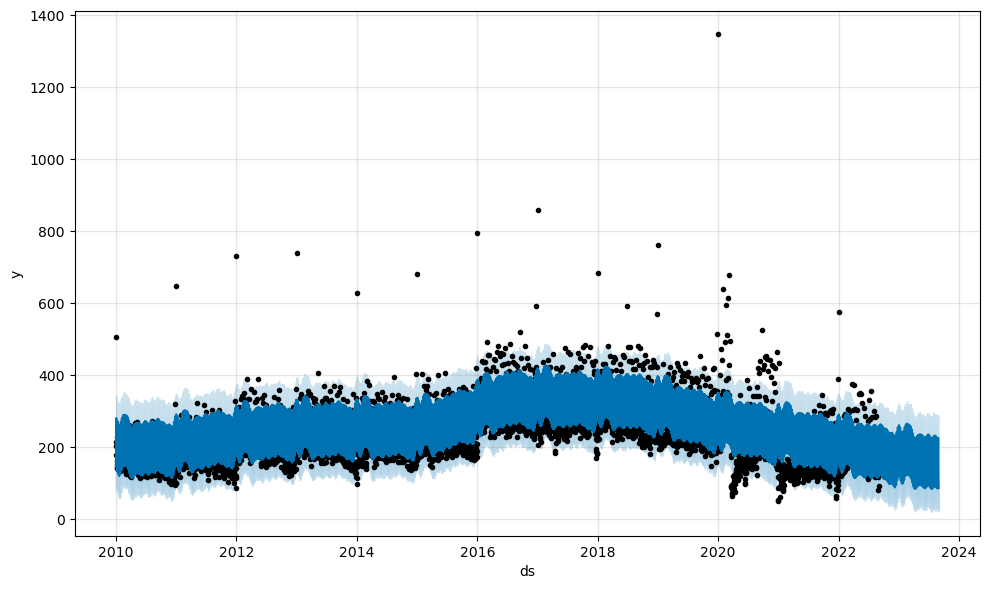

In [8]:
# Python
fig1 = model.plot(forecast)


/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


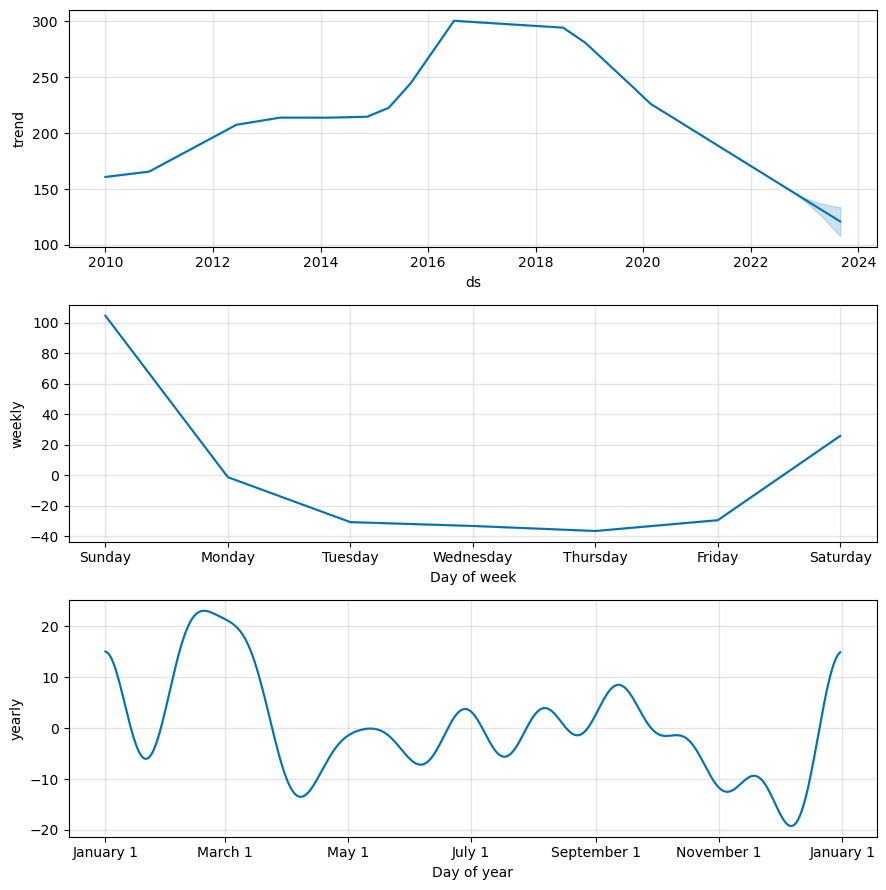

In [9]:
# Python
fig2 = model.plot_components(forecast)


In [10]:
# Python
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast)

In [11]:
# Python
plot_components_plotly(model, forecast)

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## 2010-2019

In [12]:
## Aqui separamos los datos hasta el 2019
data2 = data[data["ds"].dt.year < 2020]
data2


,ds,y
0,2010-01-01,506
1,2010-01-02,202
2,2010-01-03,212
3,2010-01-04,177
4,2010-01-05,141
...,...,...
3647,2019-12-27,198
3648,2019-12-28,224
3649,2019-12-29,263
3650,2019-12-30,224


In [13]:
#creamos otro modelo
model2 = Prophet()
model2.fit(data2)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Initial log joint probability = -104.305
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9429.38     0.0014936       172.736           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       9442.14    0.00279403       380.822       1.035      0.1035      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       9445.64    0.00516501         119.6           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     377       9447.65   0.000360339       152.312   2.006e-06       0.001      493  LS failed, Hessian reset 
     399       9448.26   0.000407444        110.12      0.6804           1      517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       9448.55   3.64312e-05    

59   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       9448.59   0.000314147       91.9017   5.002e-06       0.001      707  LS failed, Hessian reset 
     599       9449.24   4.28421e-05       57.2024      0.5973      0.5973      820   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     607       9449.28    0.00011922       148.988   1.678e-06       0.001      872  LS failed, Hessian reset 
     690       9449.55   0.000161388       127.502   2.549e-06       0.001     1018  LS failed, Hessian reset 
     699       9449.58   7.88976e-05       54.2097      0.2099           1     1031   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     779       9449.69    2.1269e-05       60.7682   3.141e-07       0.001     1175  LS failed, Hessian reset 
     799        9449.7   8.09445e-06       75.2058      0.2887      0.9462     1201   
    Iter     

In [14]:
# Python
future2 = model2.make_future_dataframe(periods=365)
future2.tail()

,ds
4012,2020-12-26
4013,2020-12-27
4014,2020-12-28
4015,2020-12-29
4016,2020-12-30


In [15]:
forecast2 = model2.predict(future2)
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,ds,yhat,yhat_lower,yhat_upper
4012,2020-12-26,264.568970,216.086271,315.506408
4013,2020-12-27,343.858001,290.522341,399.176266
4014,2020-12-28,243.559529,188.843403,293.754434
4015,2020-12-29,214.556917,168.783262,264.254780
4016,2020-12-30,211.277718,162.358821,262.833292


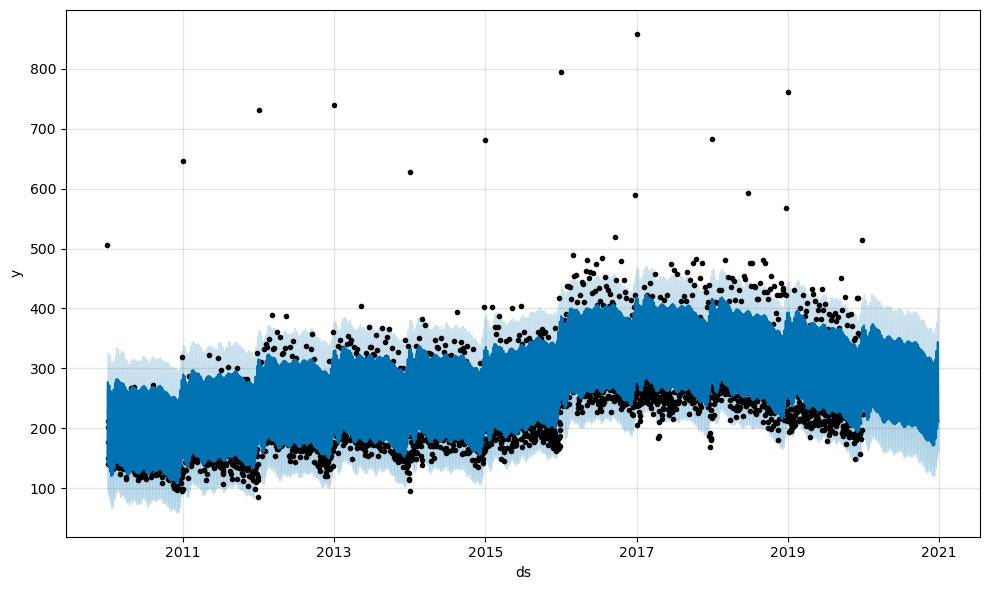

In [16]:
# Python
fig1 = model2.plot(forecast2)


/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



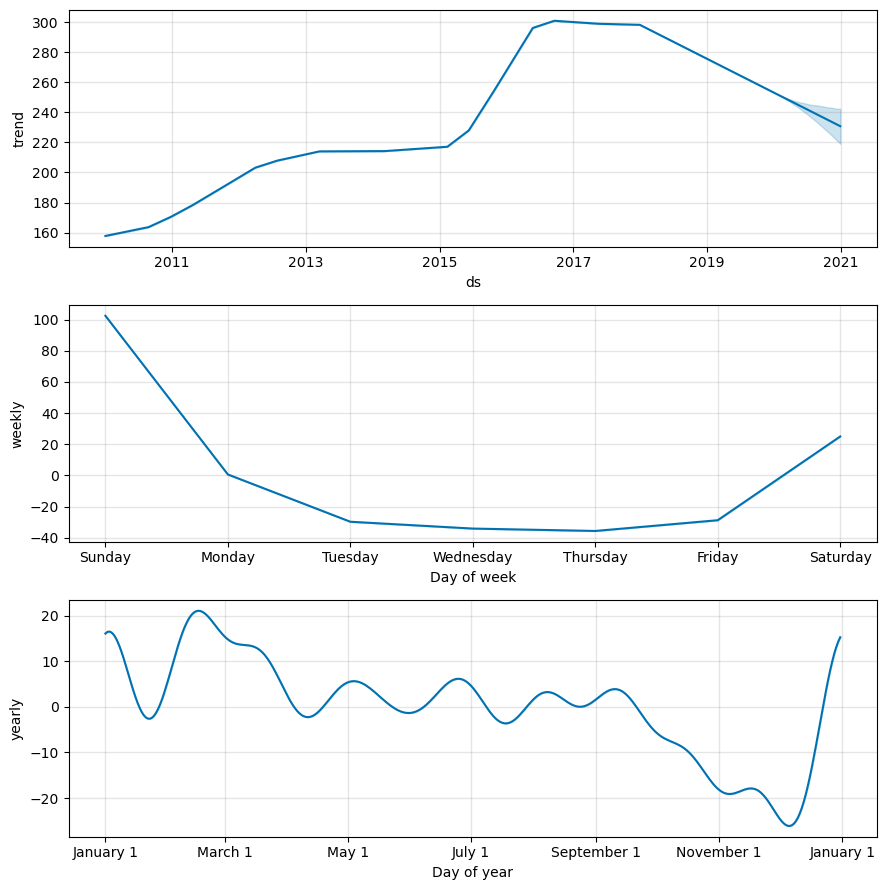

In [17]:
# Python
fig2 = model2.plot_components(forecast2)


In [18]:
# Python
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model2, forecast2)

In [19]:
# Python
plot_components_plotly(model2, forecast2)

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/root/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [20]:
from joblib import dump
dump(model, 'model.pkl') 

['model.pkl']

In [21]:
model2

In [22]:
forecast2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-01-01,157.783763,96.811271,195.961241,157.783763,157.783763,-12.776284,-12.776284,-12.776284,-28.741295,-28.741295,-28.741295,15.965012,15.965012,15.965012,0.0,0.0,0.0,145.007479
1,2010-01-02,157.808422,148.566730,248.458712,157.808422,157.808422,41.419434,41.419434,41.419434,25.034650,25.034650,25.034650,16.384784,16.384784,16.384784,0.0,0.0,0.0,199.227856
2,2010-01-03,157.833081,226.713924,326.357665,157.833081,157.833081,119.055044,119.055044,119.055044,102.525378,102.525378,102.525378,16.529667,16.529667,16.529667,0.0,0.0,0.0,276.888125
3,2010-01-04,157.857740,125.059531,228.169546,157.857740,157.857740,17.045046,17.045046,17.045046,0.638836,0.638836,0.638836,16.406210,16.406210,16.406210,0.0,0.0,0.0,174.902786
4,2010-01-05,157.882398,96.213420,194.603986,157.882398,157.882398,-13.692542,-13.692542,-13.692542,-29.718803,-29.718803,-29.718803,16.026261,16.026261,16.026261,0.0,0.0,0.0,144.189856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4012,2020-12-26,231.056955,216.086271,315.506408,219.639880,242.442989,33.512015,33.512015,33.512015,25.034650,25.034650,25.034650,8.477365,8.477365,8.477365,0.0,0.0,0.0,264.568970
4013,2020-12-27,230.995384,290.522341,399.176266,219.451274,242.414790,112.862617,112.862617,112.862617,102.525378,102.525378,102.525378,10.337240,10.337240,10.337240,0.0,0.0,0.0,343.858001
4014,2020-12-28,230.933814,188.843403,293.754434,219.344582,242.410418,12.625716,12.625716,12.625716,0.638836,0.638836,0.638836,11.986880,11.986880,11.986880,0.0,0.0,0.0,243.559529
4015,2020-12-29,230.872243,168.783262,264.254780,219.238860,242.400817,-16.315326,-16.315326,-16.315326,-29.718803,-29.718803,-29.718803,13.403477,13.403477,13.403477,0.0,0.0,0.0,214.556917


In [24]:
# Buscar la prediccion en forecast con fecha "2020-01-01"
forecast2[forecast2["ds"] == "2020-01-01"]

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
3652,2020-01-01,253.222379,187.698161,287.851052,253.222379,253.222379,-18.450134,-18.450134,-18.450134,-34.101612,-34.101612,-34.101612,15.651478,15.651478,15.651478,0.0,0.0,0.0,234.772245
